In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


pd.set_option('display.max_columns', None)
csv_file = 'data_ml.csv'

data_raw = pd.read_csv(csv_file)
idx_date=data_raw.index[(
    data_raw['date'] > '1999-12-31') &  (
data_raw['date'] < '2019-01-01')].tolist() # creating an index to retrieve the dates 
data_ml=data_raw.iloc[idx_date]
#data_ml.iloc[0:6,0:6]

In [ ]:
data_ml['date'] = pd.to_datetime(data_ml['date'])


print(data_ml['date'].max())
print(data_ml['date'].min())


In [32]:
selected_features = [
    'Advt_3M_Usd', 'Advt_6M_Usd', 'Asset_Turnover', 'Bb_Yld', 'Bv', 'Capex_Ps_Cf', 'Capex_Sales', 
    'Cash_Div_Cf', 'Cash_Per_Share', 'Cf_Sales', 'Debtequity', 'Div_Yld', 'Dps', 'Ebit_Bv', 'Ebit_Noa',
    'Ebit_Oa', 'Ebit_Ta', 'Ebitda_Margin', 'Eps', 'Eps_Basic', 'Eps_Basic_Gr', 'Eps_Contin_Oper', 'Eps_Dil',
    'Ev', 'Ev_Ebitda', 'Fa_Ci', 'Fcf', 'Fcf_Bv', 'Fcf_Ce', 'Fcf_Margin', 'Fcf_Noa', 'Fcf_Oa', 'Fcf_Ta',
    'Fcf_Tbv', 'Fcf_Toa', 'Fcf_Yld', 'Free_Ps_Cf', 'Int_Rev', 'Interest_Expense', 'Mkt_Cap_12M_Usd',
    'Mkt_Cap_3M_Usd', 'Mkt_Cap_6M_Usd', 'Mom_11M_Usd', 'Mom_5M_Usd', 'Mom_Sharp_11M_Usd', 'Mom_Sharp_5M_Usd',
    'Nd_Ebitda', 'Net_Debt', 'Net_Debt_Cf', 'Net_Margin', 'Netdebtyield', 'Ni', 'Ni_Avail_Margin', 'Ni_Oa',
    'Ni_Toa', 'Noa', 'Oa', 'Ocf', 'Ocf_Bv', 'Ocf_Ce', 'Ocf_Margin', 'Ocf_Noa', 'Ocf_Oa', 'Ocf_Ta', 'Ocf_Tbv',
    'Ocf_Toa', 'Op_Margin', 'Op_Prt_Margin', 'Oper_Ps_Net_Cf', 'Pb', 'Pe', 'Ptx_Mgn', 'Recurring_Earning_Total_Assets',
    'Return_On_Capital', 'Rev', 'Roa', 'Roc', 'Roce', 'Roe', 'Sales_Ps', 'Ta', 'Tev_Less_Mktcap', 'Tot_Debt_Rev',
    'Total_Capital', 'Total_Debt', 'Total_Debt_Capital', 'Total_Liabilities_Total_Assets'
]


In [33]:
train_cutoff = '2014-12-31'
#test_cutoff = '2017-12-31'
train_data = data_ml[data_ml['date'] <= train_cutoff]
test_data = data_ml[data_ml['date'] > train_cutoff]

#train_cutoff = '2013-12-31'
#test_cutoff = '2017-12-31'

#train_data = data_ml[data_ml['date'] <= train_cutoff]
#test_data = data_ml[(data_ml['date'] > train_cutoff) & (data_ml['date'] <= test_cutoff)]
#validation_data = data_ml[data_ml['date'] > test_cutoff]

X_train, y_train = train_data[selected_features], train_data['R1M_Usd']
X_test, y_test = test_data[selected_features], test_data['R1M_Usd']
#X_val, y_val = validation_data[selected_features], validation_data['R1M_Usd']



df_median = data_ml[['date', 'R1M_Usd']].groupby(['date']).median() 
df_median.rename(columns={"R1M_Usd": "R1M_Usd_median"}, inplace=True)

df = pd.merge(data_ml, df_median, how='left', on=['date'])
df['R1M_Usd_C'] = np.where(df['R1M_Usd'] > df['R1M_Usd_median'], 1.0, 0.0)


train_data = df[df['date'] <= '2014-12-31']
test_data = df[df['date'] > '2014-12-31']

X_train_c = train_data[selected_features]
y_train_c = train_data['R1M_Usd_C']

X_test_c = test_data[selected_features]
y_test_c = test_data['R1M_Usd_C']


# Factor Importance

Feature ranking:
1. Feature Mom_Sharp_11M_Usd (0.056705849825427534)
2. Feature Div_Yld (0.05628943722163092)
3. Feature Bb_Yld (0.03287240081465167)
4. Feature Mom_5M_Usd (0.03077401110503375)
5. Feature Dps (0.028922415218303316)
6. Feature Mom_Sharp_5M_Usd (0.025411840079068847)
7. Feature Mom_11M_Usd (0.02505967820742829)
8. Feature Tev_Less_Mktcap (0.02505916790010418)
9. Feature Ev_Ebitda (0.021999586511868736)
10. Feature Mkt_Cap_12M_Usd (0.021842725948381696)
11. Feature Netdebtyield (0.021546735493083415)
12. Feature Cash_Div_Cf (0.02117287930631843)
13. Feature Mkt_Cap_3M_Usd (0.019594746072548724)
14. Feature Fcf_Yld (0.018380317904825156)
15. Feature Mkt_Cap_6M_Usd (0.016024712860640562)
16. Feature Advt_6M_Usd (0.015834426072066213)
17. Feature Advt_3M_Usd (0.015418321589361541)
18. Feature Ebit_Ta (0.014665078858539146)
19. Feature Nd_Ebitda (0.014305673228667494)
20. Feature Int_Rev (0.013964239919183538)
21. Feature Ni (0.013420341885761564)
22. Feature Capex_Sales (0.0

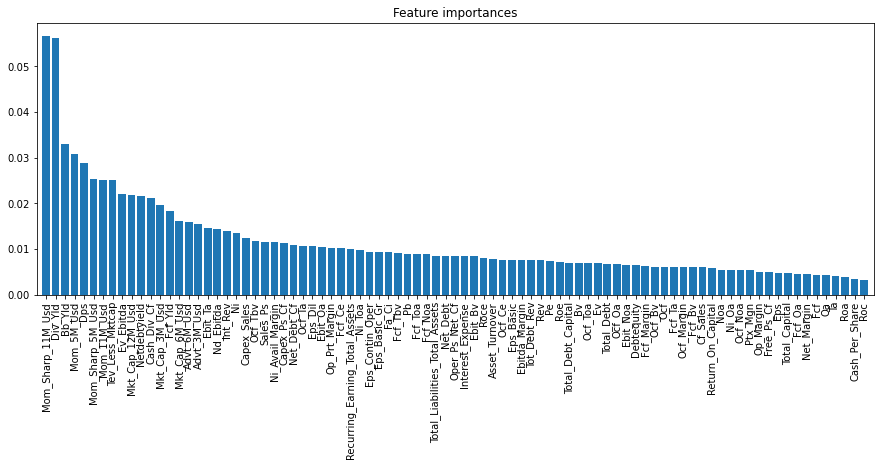

In [5]:
from sklearn.ensemble import RandomForestRegressor

# Train the Random Forest
fit_RF = RandomForestRegressor(n_estimators=100, random_state=42)
fit_RF.fit(X_train, y_train)

# Extract and rank feature importances
importances = fit_RF.feature_importances_
indices = np.argsort(importances)[::-1]

# Print and visualize the feature rankings
print("Feature ranking:")
for f in range(X_train.shape[1]):
    print(f"{f + 1}. Feature {selected_features[indices[f]]} ({importances[indices[f]]})")

plt.figure(figsize=(15, 5))
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), [selected_features[i] for i in indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

# Regression Models

In [34]:
from sklearn.ensemble import RandomForestRegressor

# Random Forest with a set of parameters
rf = RandomForestRegressor(n_estimators=100, max_depth=None, min_samples_split=2, min_samples_leaf=1)
rf.fit(X_train, y_train)

# Predict
y_pred_test_rf = rf.predict(X_test)
hit_ratio_rf = np.mean(np.sign(y_pred_test_rf) == np.sign(y_test))


In [35]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
rf_metrics = {
    "Confusion Matrix": confusion_matrix(np.sign(y_test), np.sign(y_pred_test_rf)),
    "Precision": precision_score(np.sign(y_test), np.sign(y_pred_test_rf), average='macro'),
    "Recall": recall_score(np.sign(y_test), np.sign(y_pred_test_rf), average='macro'),
    "F1 Score": f1_score(np.sign(y_test), np.sign(y_pred_test_rf), average='macro')
}


/Users/farshadmirzazad/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [36]:
rf_metrics

{'Confusion Matrix': array([[ 7134,     0, 18301],
        [  129,     0,   283],
        [ 8531,     0, 21521]]),
 'Precision': 0.3294356324609489,
 'Recall': 0.33220167889669655,
 'F1 Score': 0.3198589294577636}

In [37]:
def compute_metrics(y_test, y_pred):
    return {
        "MSE": mean_squared_error(y_test, y_pred),
        "MAE": mean_absolute_error(y_test, y_pred),
        "R2 Score": r2_score(y_test, y_pred),
        "Precision": precision_score(np.sign(y_test), np.sign(y_pred),average='macro'),
        "Recall": recall_score(np.sign(y_test), np.sign(y_pred),average='macro'),
        "F1 Score": f1_score(np.sign(y_test), np.sign(y_pred),average='macro')
    }

In [38]:
from sklearn.svm import SVR
svm_reg = SVR()
svm_reg.fit(X_train, y_train)
y_pred_svm = svm_reg.predict(X_test)


In [29]:
from sklearn.neighbors import KNeighborsRegressor
knn_reg = KNeighborsRegressor(n_neighbors=5)  # you can change the number of neighbors if required
knn_reg.fit(X_train, y_train)
y_pred_knn = knn_reg.predict(X_test)


In [6]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=1, random_state=0, loss='ls')
gbr.fit(X_train, y_train)
y_pred_gbr = gbr.predict(X_test)



In [11]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, precision_score, recall_score, f1_score
knn_metrics = compute_metrics(y_test, y_pred_knn)
knn_metrics

{'MSE': 0.04629082399470473,
 'MAE': 0.07751379452226338,
 'R2 Score': -0.04966336691595985,
 'Precision': 0.33260478951639,
 'Recall': 0.3347321310383933,
 'F1 Score': 0.3300974206718115}

In [12]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, precision_score, recall_score, f1_score
gbr_metrics = compute_metrics(y_test, y_pred_gbr)
gbr_metrics

/Users/farshadmirzazad/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'MSE': 0.04391206765846815,
 'MAE': 0.06869290493014335,
 'R2 Score': 0.00427590591384297,
 'Precision': 0.17920415988359958,
 'Recall': 0.3333333333333333,
 'F1 Score': 0.23309404971049394}

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, precision_score, recall_score, f1_score

svm_metrics = compute_metrics(y_test, y_pred_svm)
svm_metrics


/Users/farshadmirzazad/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/Users/farshadmirzazad/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/Users/farshadmirzazad/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/Users/farshadmirzazad/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and 

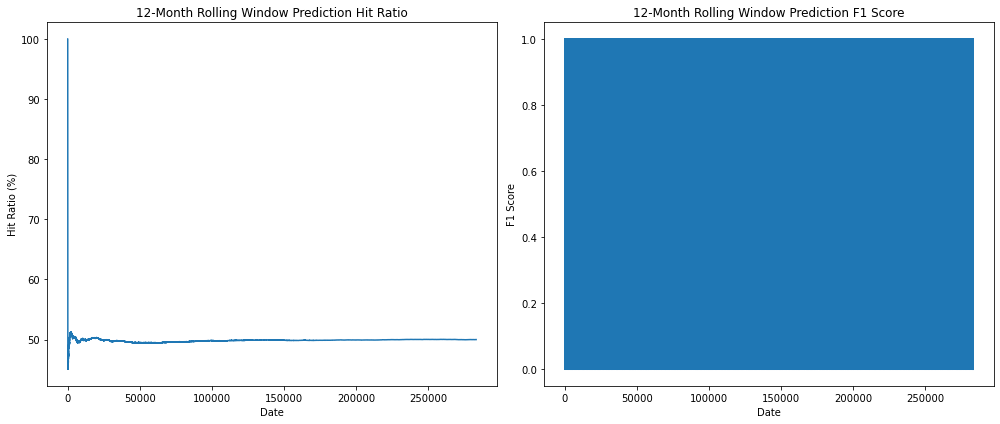

In [24]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt

# Assuming data_ml is a DataFrame with a DateTime index and 'R1M_Usd' is the target column
hit_ratios = []
f1_scores = []
dates = []

for i in range(12, len(data_ml)):
    train = data_ml.iloc[i-12:i]
    test = data_ml.iloc[i]

    X_train = train[selected_features].values.reshape(-1, len(selected_features))
    y_train = train['R1M_Usd'].values

    X_test = test[selected_features].values.reshape(1, -1)
    y_test = test['R1M_Usd']

    model = LinearRegression()
    model.fit(X_train, y_train)
    prediction = model.predict(X_test)

    # Convert prediction and y_test to binary format (1 for positive, 0 for negative)
    #y_pred_binary = [1 if val >= 0 else 0 for val in prediction]
    #y_test_binary = [1 if val >= 0 else 0 for val in y_test]

    y_pred_binary = [1 if prediction[0] >= 0 else 0]
    y_test_binary = [1 if y_test >= 0 else 0]

    # Check if prediction and actual value have the same sign
    correct_direction = np.sign(prediction[0]) == np.sign(y_test)
    hit_ratios.append(correct_direction)
    dates.append(data_ml.index[i])

    # Calculate F1 score
    f1 = f1_score(y_test_binary, y_pred_binary)
    f1_scores.append(f1)

# Convert hit_ratios to percentages
hit_ratios_percentage = [sum(hit_ratios[:i+1]) / (i+1) * 100 for i in range(len(hit_ratios))]

# Plot Hit Ratios
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(dates, hit_ratios_percentage)
plt.xlabel('Date')
plt.ylabel('Hit Ratio (%)')
plt.title('12-Month Rolling Window Prediction Hit Ratio')

# Plot F1 scores
plt.subplot(1, 2, 2)
plt.plot(dates, f1_scores)
plt.xlabel('Date')
plt.ylabel('F1 Score')
plt.title('12-Month Rolling Window Prediction F1 Score')

plt.tight_layout()
plt.show()


In [ ]:
hit_ratios_percentage

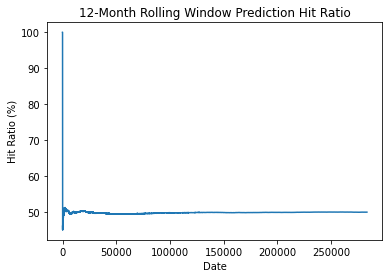

In [16]:
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Assuming data_ml is a DataFrame with a DateTime index and 'R1M_Usd' is the target column
hit_ratios = []
dates = []

for i in range(12, len(data_ml)):
    train = data_ml.iloc[i-12:i]
    test = data_ml.iloc[i]

    X_train = train[selected_features].values.reshape(-1, len(selected_features))
    y_train = train['R1M_Usd'].values

    X_test = test[selected_features].values.reshape(1, -1)
    y_test = test['R1M_Usd']

    model = LinearRegression()
    model.fit(X_train, y_train)
    prediction = model.predict(X_test)

    # Check if prediction and actual value have the same sign
    correct_direction = np.sign(prediction[0]) == np.sign(y_test)
    hit_ratios.append(correct_direction)
    dates.append(data_ml.index[i])

# Convert hit_ratios to percentages
hit_ratios_percentage = [sum(hit_ratios[:i+1]) / (i+1) * 100 for i in range(len(hit_ratios))]

plt.plot(dates, hit_ratios_percentage)
plt.xlabel('Date')
plt.ylabel('Hit Ratio (%)')
plt.title('12-Month Rolling Window Prediction Hit Ratio')
plt.show()


# Classification Models

In [13]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train_c, y_train_c)
y_pred_rf = rf.predict(X_test_c)


In [15]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
rf_c_metrics = {
    "Confusion Matrix": confusion_matrix(y_test_c, y_pred_rf),
    "Precision": precision_score(y_test_c, y_pred_rf),
    "Recall": recall_score(y_test_c, y_pred_rf),
    "F1 Score": f1_score(y_test_c, y_pred_rf)
}
rf_c_metrics

{'Confusion Matrix': array([[15664, 12482],
        [15615, 12138]]),
 'Precision': 0.49301380991064175,
 'Recall': 0.4373581234461139,
 'F1 Score': 0.4635212800488801}

In [16]:
import xgboost as xgb

xgb_clf = xgb.XGBClassifier()
xgb_clf.fit(X_train_c, y_train_c)
y_pred_xgb = xgb_clf.predict(X_test_c)


In [18]:
xgb_c_metrics = {
    "Confusion Matrix": confusion_matrix(y_test_c, y_pred_xgb),
    "Precision": precision_score(y_test_c, y_pred_xgb),
    "Recall": recall_score(y_test_c, y_pred_xgb),
    "F1 Score": f1_score(y_test_c, y_pred_xgb)
}
xgb_c_metrics

{'Confusion Matrix': array([[14177, 13969],
        [13989, 13764]]),
 'Precision': 0.4963040421158908,
 'Recall': 0.49594638417468384,
 'F1 Score': 0.49612514868615504}

In [19]:
from sklearn.svm import SVC

svm_clf = SVC(kernel='linear')
svm_clf.fit(X_train_c, y_train_c)
y_pred_svm = svm_clf.predict(X_test_c)


In [20]:
svm_c_metrics = {
    "Confusion Matrix": confusion_matrix(y_test_c, y_pred_svm),
    "Precision": precision_score(y_test_c, y_pred_svm),
    "Recall": recall_score(y_test_c, y_pred_svm),
    "F1 Score": f1_score(y_test_c, y_pred_svm)
}
svm_c_metrics

{'Confusion Matrix': array([[14578, 13568],
        [14515, 13238]]),
 'Precision': 0.49384466164291574,
 'Recall': 0.47699347818253884,
 'F1 Score': 0.48527282391539434}

In [21]:
from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier(n_neighbors=5)
knn_clf.fit(X_train_c, y_train_c)
y_pred_knn = knn_clf.predict(X_test_c)


In [22]:
knn_c_metrics = {
    "Confusion Matrix": confusion_matrix(y_test_c, y_pred_knn),
    "Precision": precision_score(y_test_c, y_pred_knn),
    "Recall": recall_score(y_test_c, y_pred_knn),
    "F1 Score": f1_score(y_test_c, y_pred_knn)
}
knn_c_metrics 

{'Confusion Matrix': array([[14098, 14048],
        [13750, 14003]]),
 'Precision': 0.4991978895583045,
 'Recall': 0.5045580657946889,
 'F1 Score': 0.5018636656870475}

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Random Forest
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

# Performance metrics for Random Forest
rf_metrics = {
    "Confusion Matrix": confusion_matrix(y_test, y_pred_rf),
    "Precision": precision_score(y_test, y_pred_rf),
    "Recall": recall_score(y_test, y_pred_rf),
    "F1 Score": f1_score(y_test, y_pred_rf)
}

# XGBoost
xgb_clf = xgb.XGBClassifier()
xgb_clf.fit(X_train, y_train)
y_pred_xgb = xgb_clf.predict(X_test)

# Performance metrics for XGBoost
xgb_metrics = {
    "Confusion Matrix": confusion_matrix(y_test, y_pred_xgb),
    "Precision": precision_score(y_test, y_pred_xgb),
    "Recall": recall_score(y_test, y_pred_xgb),
    "F1 Score": f1_score(y_test, y_pred_xgb)
}

# SVM
svm_clf = SVC(kernel='linear')
svm_clf.fit(X_train, y_train)
y_pred_svm = svm_clf.predict(X_test)

# Performance metrics for SVM
svm_metrics = {
    "Confusion Matrix": confusion_matrix(y_test, y_pred_svm),
    "Precision": precision_score(y_test, y_pred_svm),
    "Recall": recall_score(y_test, y_pred_svm),
    "F1 Score": f1_score(y_test, y_pred_svm)
}

# KNN
knn_clf = KNeighborsClassifier(n_neighbors=5)
knn_clf.fit(X_train, y_train)
y_pred_knn = knn_clf.predict(X_test)

# Performance metrics for KNN
knn_metrics = {
    "Confusion Matrix": confusion_matrix(y_test, y_pred_knn),
    "Precision": precision_score(y_test, y_pred_knn),
    "Recall": recall_score(y_test, y_pred_knn),
    "F1 Score": f1_score(y_test, y_pred_knn)
}

# Now you have four dictionaries (rf_metrics, xgb_metrics, svm_metrics, knn_metrics) containing performance metrics for each model.


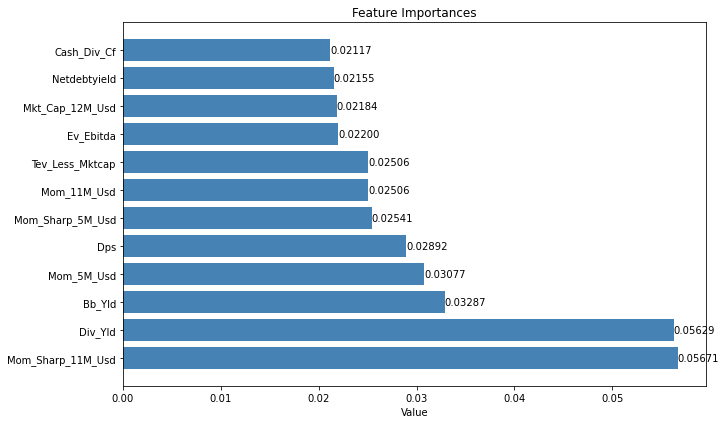

In [43]:
import matplotlib.pyplot as plt

# Data
features = [
    "Mom_Sharp_11M_Usd",
    "Div_Yld",
    "Bb_Yld",
    "Mom_5M_Usd",
    "Dps",
    "Mom_Sharp_5M_Usd",
    "Mom_11M_Usd",
    "Tev_Less_Mktcap",
    "Ev_Ebitda",
    "Mkt_Cap_12M_Usd",
    "Netdebtyield",
    "Cash_Div_Cf"
]
values = [
    0.056705849825427534,
    0.05628943722163092,
    0.03287240081465167,
    0.03077401110503375,
    0.028922415218303316,
    0.025411840079068847,
    0.02505967820742829,
    0.02505916790010418,
    0.021999586511868736,
    0.021842725948381696,
    0.021546735493083415,
    0.02117287930631843
]

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(features, values, color='steelblue')
ax.set_xlabel('Value')
ax.set_title('Feature Importances')
plt.tight_layout()

# Display the numbers at the end of the bars
for index, value in enumerate(values):
    ax.text(value, index, f'{value:.5f}', va='center')

plt.show()


In [1]:
knn_c_metrics
svm_c_metrics
xgb_c_metrics
rf_c_metrics

NameError: name 'knn_c_metrics' is not defined